# Example - MNIST

In [2]:
import pandas as pd
import numpy as np
import time
import pickle
import os

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

np.random.seed(2024)
import sys
sys.path.append('../..')

from topomap.visualizations import plot_topomap_comparison_highlight, plot_hierarchical_treemap

from topomap import TopoMap, TopoTree, HierarchicalTopoMap

from topomap.dataset_utils import fvecs_read

In [3]:
from keras.datasets import mnist
(train_X, train_y), (test_X, test_y) = mnist.load_data()

n = train_X.shape[0]
points = np.zeros((n, 28*28))
for i in range(n):
    points[i,:] = train_X[i,:,:].ravel()

# Set data type to float32 so that we can use ANN
points = np.float32(points)
points.shape

(60000, 784)

In [4]:
topomap_path = 'mnist-topomap.pkl'

if os.path.isfile(topomap_path):
    with open(topomap_path, 'rb') as f:
        topomap = pickle.load(f)
    proj_topomap = topomap.projections
else:
    start = time.time()
    topomap = TopoMap(approach='ANN')
    proj_topomap = topomap.fit_transform(points)
    print(f'Time for runinning TopoMap: {time.time() - start}s')

    with open(topomap_path,'wb') as f:
        pickle.dump(topomap, f)

Time for runinning TopoMap: 600.9948124885559s


In [5]:
with open('mnist_mst_euclidean.npy', 'wb') as f:
    np.save(f, topomap.mst)

In [6]:
topotree_path = 'mnist-topotree.pkl'

if os.path.isfile(topotree_path):
    with open(topotree_path, 'rb') as f:
        topotree = pickle.load(f)
    comp_info_samples = topotree.components_info
else:
    start = time.time()
    topotree = TopoTree(min_box_size=150)
    topotree.mst = topomap.mst
    topotree.sorted_edges = topomap.sorted_edges
    comp_info_samples = topotree.fit(points)
    with open(topotree_path, 'wb') as f:
        pickle.dump(topotree, f)

    topotree_time = time.time()-start
    print(f'Time for runinning TopoTree: {topotree_time}s')

df_comp_samples = pd.DataFrame.from_dict(comp_info_samples)

df_comp_samples.head()

Time for runinning TopoTree: 8.974091053009033s


,id,size,points,persistence,created_at,children,parent,died_at,persistence_density
0,0,1063,"[49943, 52648, 35558, 32677, 45546, 49899, 389...",39.787262,360.580078,268,2.0,400.367340,2.655062
1,1,541,"[44561, 57785, 47055, 10947, 59033, 8937, 2778...",31.699463,368.667877,124,2.0,400.367340,1.351259
2,2,6278,"[49943, 52648, 35558, 32677, 45546, 49899, 389...",342.378265,400.367340,3077,4.0,742.745605,8.452423
3,3,370,"[48146, 58733, 21175, 49862, 13048, 50227, 506...",21.790710,720.954895,56,4.0,742.745605,0.498152
4,4,8022,"[49943, 52648, 35558, 32677, 45546, 49899, 389...",91.153076,742.745605,649,7.0,833.898682,9.619874


In [7]:
fig = plot_hierarchical_treemap(df_comp_samples, color='died_at')
fig.update_layout(title='TopoTree - MNIST',
                                    height=500,
                    width=700,)
fig.show()

In [8]:
hiertopomap_path = 'mnist-hiertopomap-15comp.pkl'

if os.path.isfile(hiertopomap_path):
    with open(hiertopomap_path, 'rb') as f:
        hiertopomap = pickle.load(f)
        proj_hier = hiertopomap.projections

else:
    start_time = time.time()

    hiertopomap = HierarchicalTopoMap(k_components= 15,
                                      max_scalar=100,
                                      blowout_scalar=5)
    hiertopomap.min_points_component = topotree.min_box_size
    hiertopomap.mst = topotree.mst
    hiertopomap.sorted_edges = topotree.sorted_edges
    proj_hier = hiertopomap.fit_transform(points)

    hiertopomap_time = time.time()-start_time
    print(f'Time for runinning HierarchicalTopoMap: {hiertopomap_time}s')

    with open(hiertopomap_path, 'wb') as f:
        pickle.dump(hiertopomap, f)

Scalling component 0 - Scalar: 57.895 - initial area: 1911537408.000... final area: 6407227179008.000.
Scalling component 1 - Scalar: 58.335 - initial area: 699050752.000... final area: 2378856923136.000.
Scalling component 3 - Scalar: 30.154 - initial area: 1156476672.000... final area: 1051509456896.000.
Scalling component 5 - Scalar: 27.259 - initial area: 572220160.000... final area: 425186951168.000.
Scalling component 8 - Scalar: 26.347 - initial area: 864241728.000... final area: 599927881728.000.
Scalling component 6 - Scalar: 24.086 - initial area: 29450561536.000... final area: 17085264560128.000.
Scalling component 13 - Scalar: 21.081 - initial area: 736811584.000... final area: 327455178752.000.
Scalling component 15 - Scalar: 20.513 - initial area: 3575360768.000... final area: 1504447168512.000.
Scalling component 17 - Scalar: 20.112 - initial area: 867468544.000... final area: 350880202752.000.
Scalling component 10 - Scalar: 20.756 - initial area: 116379795456.000... fi

In [9]:
components_to_highligth = hiertopomap.components_to_scale

fig = plot_topomap_comparison_highlight(proj_topomap, proj_hier, 
                                               components_to_highligth, df_comp_samples,
                                               )
fig.update_layout(height=600, width=1200, title='MNIST')
fig.show()

In [10]:
nums_per_comp = []

for component in components_to_highligth:
    points = df_comp_samples.loc[component]["points"]
    labels = train_y[points]

    dict_comp = {'Component': component}
    for i in range(10):
        n_i = sum(labels==i)
        dict_comp[i] = n_i

    nums_per_comp.append(dict_comp)

nums_comp_df = pd.DataFrame(nums_per_comp)
nums_comp_df.set_index('Component')

,0,1,2,3,4,5,6,7,8,9
Component,,,,,,,,,,
10,2654,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1547,0,0,0
0,0,1063,0,0,0,0,0,0,0,0
12,0,0,0,0,0,906,0,0,0,0
1,0,541,0,0,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,480,0
3,0,0,0,0,0,0,0,370,0,0
8,0,0,0,0,2,0,0,0,0,324
5,0,0,0,0,0,0,0,0,0,176


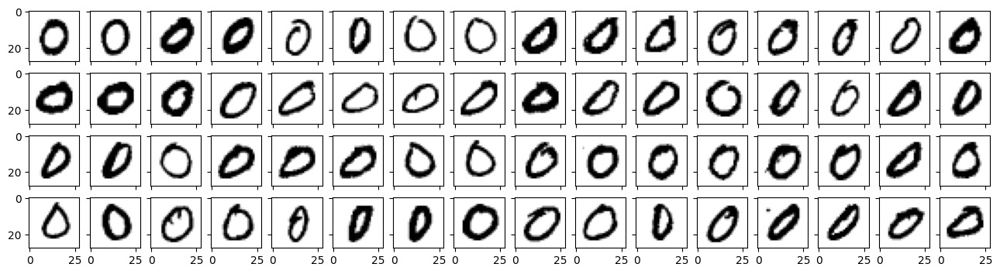

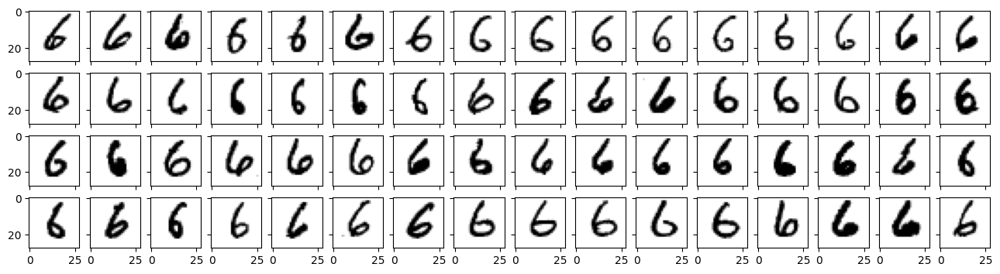

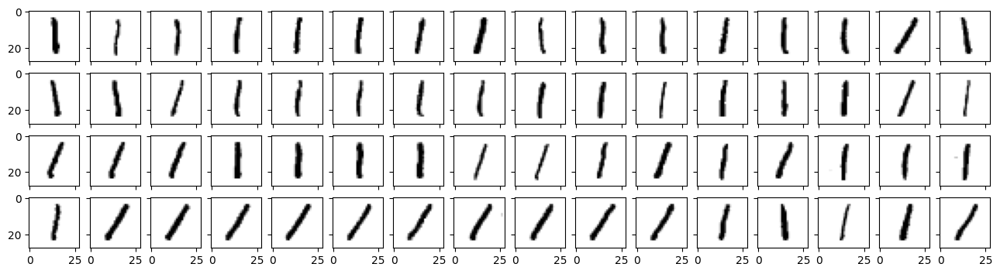

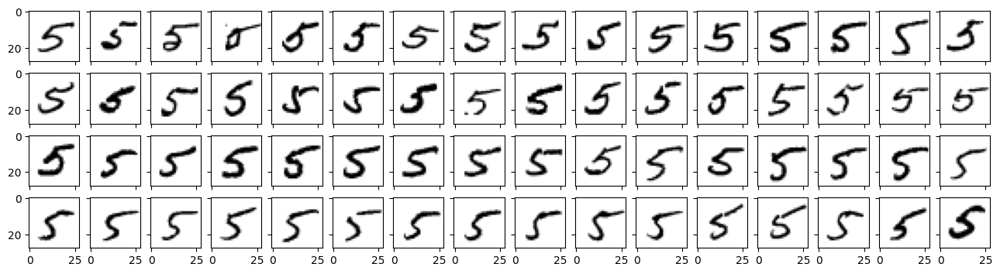

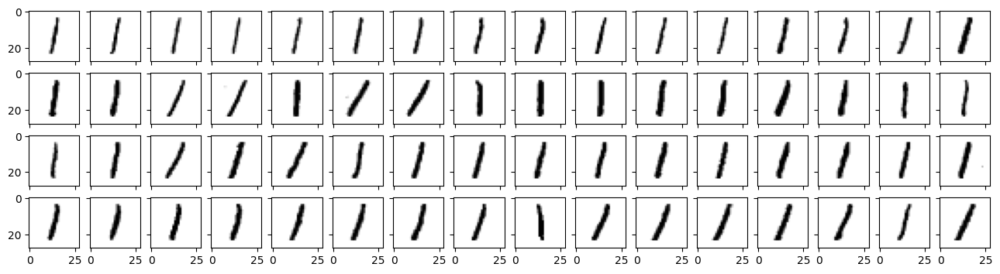

...

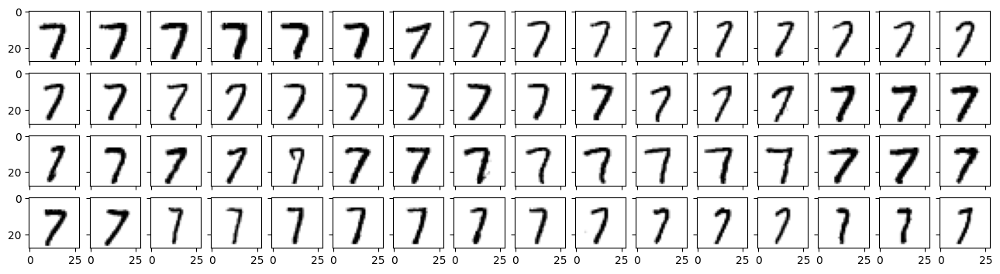

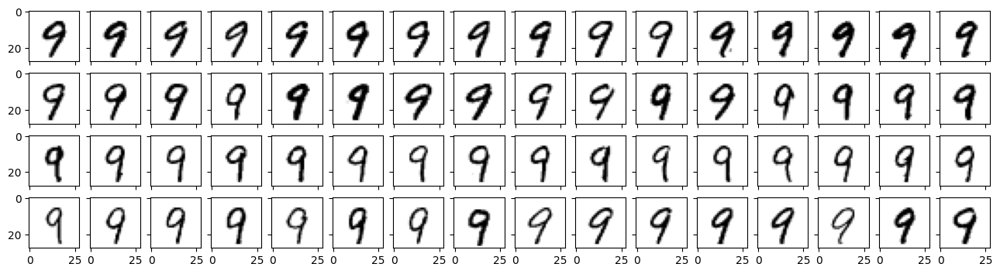

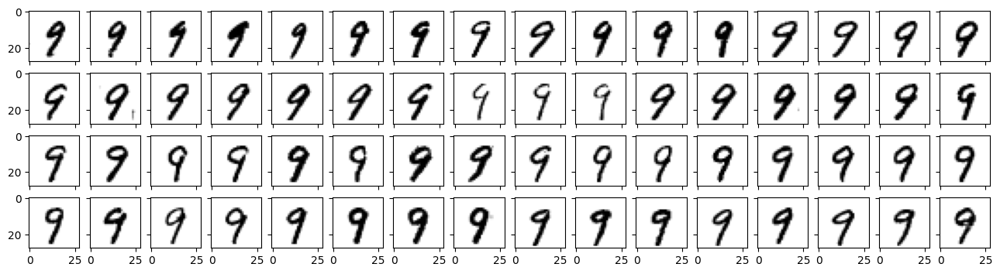

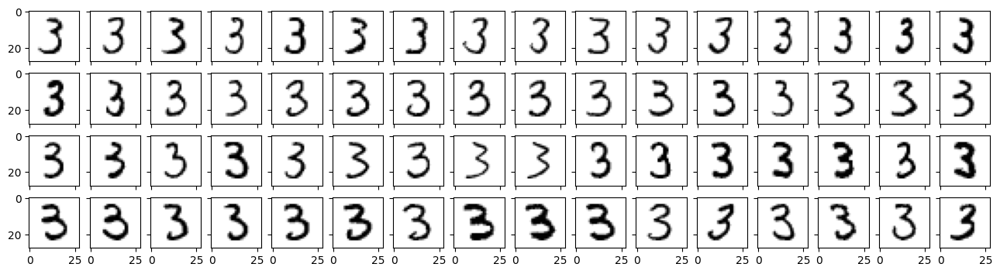

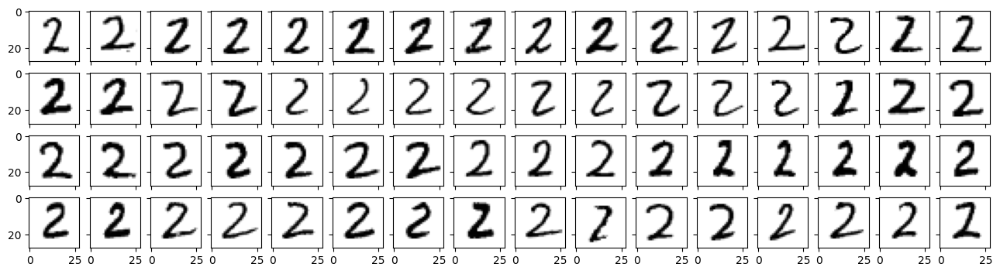

In [11]:
import matplotlib.pyplot as plt

for c in components_to_highligth:
    points_id = df_comp_samples.loc[c,'points']
    l = len(points_id)

    fig, axs = plt.subplots(4, 16, figsize=(16,4), sharex=True, sharey=True)
    ix, iy = 0, 0
    for i in range(64):
        ix = i%16
        iy = i//16

        axs[iy,ix].imshow(train_X[points_id[l-64+i]], cmap=plt.get_cmap('gray_r'))

In [11]:
from topomap.visualizations import plot_projections_discrete_feature

df_train = pd.DataFrame()
df_train['label'] = train_y

fig = plot_projections_discrete_feature(proj_hier,
                                        df_train,
                                        column_color = 'label',
                                        legend_title="Digit",
                                        column_values=list(range(10)),
                                        low_opacity=False,
                                        hiertopomap=hiertopomap)
fig.update_layout(height=600,width=800)
fig.show()